# Import Libraries

In [1]:
import os
import cv2
import math

import random
import numpy as np
import datetime as dt
import tensorflow as tf
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

In [3]:
pip install decord

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 118.5 MB/s eta 0:00:00


In [4]:
pip install -qU torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 118.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 92.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 42.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 105.5 MB/s eta 0:00:00


In [5]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import decord
from google.colab import drive
from torchvision import models, transforms
from sklearn.model_selection import train_test_split
from tqdm.auto import tqdm
from torch.utils.data import Dataset, DataLoader
#from torchmetrics import Accuracy

In [6]:
seed_constant = 27
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

In [7]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Load Data

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:


import tensorflow as tf
import numpy as np

# ✅ Step 1: Check if GPU is available
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            # ✅ Enable GPU memory growth instead of setting a hard limit
            tf.config.experimental.set_memory_growth(gpu, True)
        print("✅ GPU memory growth enabled.")
    except RuntimeError as e:
        print("⚠️ Error setting memory growth:", e)
else:
    print("❌ No GPU detected. Please enable GPU in Colab: Runtime > Change runtime type > GPU.")

✅ GPU memory growth enabled.


# EDA

['cover', 'square_cut', 'late_cut', 'flick', 'lofted', 'defense', 'pull', 'hook', 'sweep', 'straight']


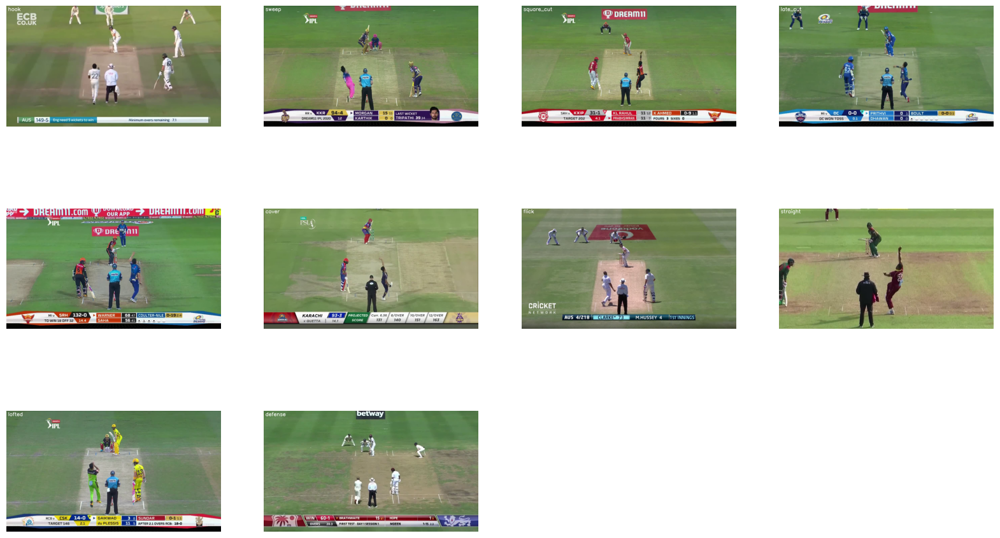

In [26]:


import os
import cv2
import random
import matplotlib.pyplot as plt

categories = []

def display_random_video_frames(dataset_path, num_frames=20):
    """
    Display random frames from random videos in the specified dataset directory.

    Args:
    - dataset_path (str): Path to the dataset directory.
    - num_frames (int): Number of frames to display. Default is 20.
    """
    # Create a Matplotlib figure and specify the size of the figure.
    plt.figure(figsize=(20, 20))

    # Get the names of all classes/categories in the dataset.
    all_classes_names = os.listdir(dataset_path)
    print(all_classes_names)
    categories.append(all_classes_names)

    # Generate a list of random class indices.
    random_indices = random.sample(range(len(all_classes_names)), min(num_frames, len(all_classes_names)))

    # Iterate through the randomly selected class indices.
    for counter, random_index in enumerate(random_indices, 1):
        # Retrieve the class name using the random index.
        selected_class_name = all_classes_names[random_index]

        # Retrieve the list of all video files present in the selected class directory.
        video_files_names_list = os.listdir(os.path.join(dataset_path, selected_class_name))

        # Check if the directory is not empty before selecting a video file.
        if video_files_names_list:  # This is equivalent to if len(video_files_names_list) > 0:
            selected_video_file_name = random.choice(video_files_names_list)

            # Proceed with reading the video frame only if a video file was selected.
            video_reader = cv2.VideoCapture(os.path.join(dataset_path, selected_class_name, selected_video_file_name))

            # Read the first frame of the video file.
            _, bgr_frame = video_reader.read()

            # Release the VideoCapture object.
            video_reader.release()

            # Convert the frame from BGR into RGB format.
            rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)

            # Write the class name on the video frame.
            cv2.putText(rgb_frame, selected_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

            # Display the frame.
            plt.subplot(5, 4, counter)
            plt.imshow(rgb_frame)
            plt.axis('off')
        else:
            print(f"Skipping empty directory: {selected_class_name}") # Print a message if the directory is empty

    plt.savefig("/content/drive/MyDrive/figures/randomframes.png", bbox_inches='tight')
    # Show the Matplotlib figure with the randomly selected frames.
    plt.show()



# Example usage:
dataset_path = "/content/drive/MyDrive/CricShot10 dataset"
display_random_video_frames(dataset_path)

In [16]:
def analyze_frame_counts(dataset_dir, classes_list):
    frame_counts = {class_name: [] for class_name in classes_list}

    # Collect frame counts for each class
    for class_name in classes_list:
        class_dir = os.path.join(dataset_dir, class_name)
        for video_file in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_file)
            video_reader = cv2.VideoCapture(video_path)
            frame_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
            video_reader.release()
            frame_counts[class_name].append(frame_count)

    # Compute statistics (avg, min, max)
    frame_stats = {class_name: {} for class_name in classes_list}
    avg_frames, min_frames, max_frames = [], [], []

    for class_name, counts in frame_counts.items():
        if counts:  # Ensure there are videos in the class
            frame_stats[class_name]["avg"] = np.mean(counts)
            frame_stats[class_name]["min"] = np.min(counts)
            frame_stats[class_name]["max"] = np.max(counts)
        else:  # Handle empty classes
            frame_stats[class_name]["avg"] = 0
            frame_stats[class_name]["min"] = 0
            frame_stats[class_name]["max"] = 0

        avg_frames.append(frame_stats[class_name]["avg"])
        min_frames.append(frame_stats[class_name]["min"])
        max_frames.append(frame_stats[class_name]["max"])

    # Print statistics
    for class_name, stats in frame_stats.items():
        print(f"Class: {class_name}, Avg: {stats['avg']:.2f}, Min: {stats['min']}, Max: {stats['max']}")

    # Bar Chart Visualization
    x = np.arange(len(classes_list))  # X-axis positions

    plt.figure(figsize=(12, 6))
    bar_width = 0.2  # Space between bars

    plt.bar(x - bar_width, avg_frames, width=bar_width, label="Avg Frames", color='orange')
    plt.bar(x, min_frames, width=bar_width, label="Min Frames", color='green')
    plt.bar(x + bar_width, max_frames, width=bar_width, label="Max Frames", color='blue')

    plt.xlabel("Class Name")
    plt.ylabel("Frame Count")
    plt.title("Frame Count Statistics per Class")
    plt.xticks(x, classes_list, rotation=45)
    plt.legend()
    plt.grid(axis='y', linestyle="--", alpha=0.7)
    plt.savefig("/content/drive/MyDrive/figures/framecount.png", bbox_inches='tight')
    plt.show()


    return frame_stats  # Return statistics dictionary


Class: cover, Avg: 55.62, Min: 27, Max: 101
Class: square_cut, Avg: 58.42, Min: 33, Max: 177
Class: late_cut, Avg: 54.98, Min: 25, Max: 107
Class: flick, Avg: 52.35, Min: 29, Max: 177
Class: lofted, Avg: 105.58, Min: 34, Max: 229
Class: defense, Avg: 73.28, Min: 32, Max: 127
Class: pull, Avg: 50.34, Min: 27, Max: 126
Class: hook, Avg: 52.25, Min: 30, Max: 123
Class: sweep, Avg: 59.78, Min: 32, Max: 120
Class: straight, Avg: 77.42, Min: 45, Max: 120


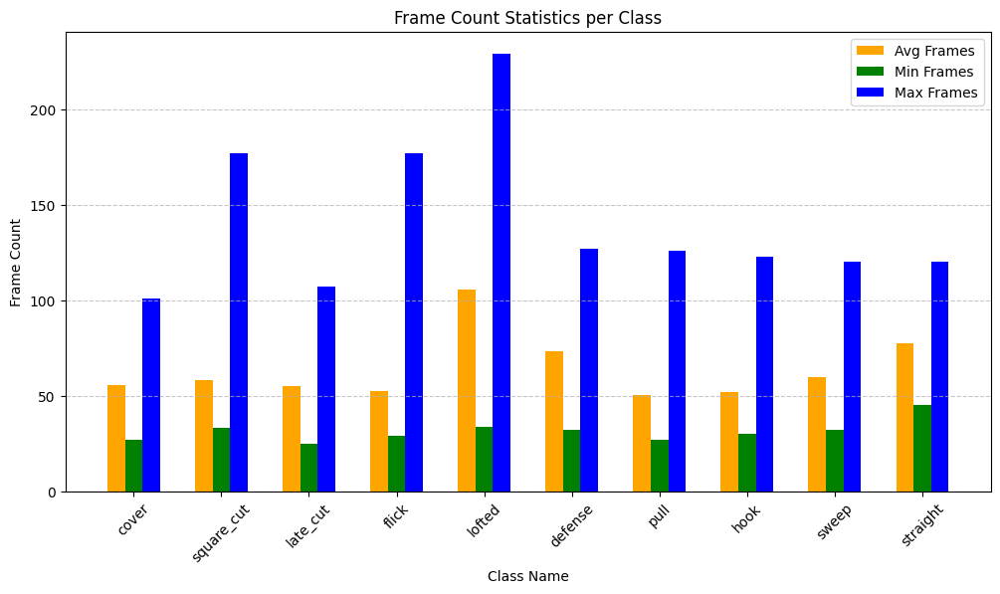

{'cover': {'avg': np.float64(55.61702127659574),
  'min': np.int64(27),
  'max': np.int64(101)},
 'square_cut': {'avg': np.float64(58.425),
  'min': np.int64(33),
  'max': np.int64(177)},
 'late_cut': {'avg': np.float64(54.97802197802198),
  'min': np.int64(25),
  'max': np.int64(107)},
 'flick': {'avg': np.float64(52.348066298342545),
  'min': np.int64(29),
  'max': np.int64(177)},
 'lofted': {'avg': np.float64(105.57575757575758),
  'min': np.int64(34),
  'max': np.int64(229)},
 'defense': {'avg': np.float64(73.28125),
  'min': np.int64(32),
  'max': np.int64(127)},
 'pull': {'avg': np.float64(50.33519553072626),
  'min': np.int64(27),
  'max': np.int64(126)},
 'hook': {'avg': np.float64(52.248618784530386),
  'min': np.int64(30),
  'max': np.int64(123)},
 'sweep': {'avg': np.float64(59.77835051546392),
  'min': np.int64(32),
  'max': np.int64(120)},
 'straight': {'avg': np.float64(77.41968911917098),
  'min': np.int64(45),
  'max': np.int64(120)}}

In [17]:
analyze_frame_counts(dataset_path, categories[0])
# print(categories)

In [19]:


def analyze_frame_counts_and_fps(dataset_dir, classes_list):
    frame_counts = {class_name: [] for class_name in classes_list}
    fps_values = {class_name: [] for class_name in classes_list}

    # Collect frame counts and FPS for each class
    for class_name in classes_list:
        class_dir = os.path.join(dataset_dir, class_name)
        for video_file in os.listdir(class_dir):
            video_path = os.path.join(class_dir, video_file)
            video_reader = cv2.VideoCapture(video_path)
            frame_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))
            fps = video_reader.get(cv2.CAP_PROP_FPS)
            video_reader.release()
            frame_counts[class_name].append(frame_count)
            fps_values[class_name].append(fps)

    # Compute statistics (avg, min, max) for frame counts and FPS
    frame_stats = {class_name: {} for class_name in classes_list}
    fps_stats = {class_name: {} for class_name in classes_list}
    avg_frames, min_frames, max_frames = [], [], []
    avg_fps, min_fps, max_fps = [], [], []

    for class_name in classes_list:
        counts = frame_counts[class_name]
        fps_list = fps_values[class_name]

        if counts:  # Ensure there are videos in the class
            frame_stats[class_name]["avg"] = np.mean(counts)
            frame_stats[class_name]["min"] = np.min(counts)
            frame_stats[class_name]["max"] = np.max(counts)
            fps_stats[class_name]["avg"] = np.mean(fps_list)
            fps_stats[class_name]["min"] = np.min(fps_list)
            fps_stats[class_name]["max"] = np.max(fps_list)
        else:  # Handle empty classes
            frame_stats[class_name]["avg"] = 0
            frame_stats[class_name]["min"] = 0
            frame_stats[class_name]["max"] = 0
            fps_stats[class_name]["avg"] = 0
            fps_stats[class_name]["min"] = 0
            fps_stats[class_name]["max"] = 0

        avg_frames.append(frame_stats[class_name]["avg"])
        min_frames.append(frame_stats[class_name]["min"])
        max_frames.append(frame_stats[class_name]["max"])
        avg_fps.append(fps_stats[class_name]["avg"])
        min_fps.append(fps_stats[class_name]["min"])
        max_fps.append(fps_stats[class_name]["max"])

    # Print frame count statistics
    for class_name, stats in frame_stats.items():
        print(f"Class: {class_name}, Avg Frames: {stats['avg']:.2f}, Min Frames: {stats['min']}, Max Frames: {stats['max']}")

    # Print FPS statistics
    for class_name, stats in fps_stats.items():
        print(f"Class: {class_name}, Avg FPS: {stats['avg']:.2f}, Min FPS: {stats['min']}, Max FPS: {stats['max']}")

    # Bar Chart Visualization for Frame Counts
    x = np.arange(len(classes_list))  # X-axis positions

    plt.figure(figsize=(12, 6))
    bar_width = 0.2  # Space between bars

    plt.bar(x - bar_width, avg_frames, width=bar_width, label="Avg Frames", color='orange')
    plt.bar(x, min_frames, width=bar_width, label="Min Frames", color='green')
    plt.bar(x + bar_width, max_frames, width=bar_width, label="Max Frames", color='blue')

    plt.xlabel("Class Name")
    plt.ylabel("Frame Count")
    plt.title("Frame Count Statistics per Class")
    plt.xticks(x, classes_list, rotation=45)
    plt.legend()
    plt.grid(axis='y', linestyle="--", alpha=0.7)
    plt.savefig("/content/drive/MyDrive/figures/frames.png", bbox_inches='tight')
    plt.show()

    # Bar Chart Visualization for FPS
    plt.figure(figsize=(12, 6))
    plt.bar(x - bar_width, avg_fps, width=bar_width, label="Avg FPS", color='orange')
    plt.bar(x, min_fps, width=bar_width, label="Min FPS", color='green')
    plt.bar(x + bar_width, max_fps, width=bar_width, label="Max FPS", color='blue')

    plt.xlabel("Class Name")
    plt.ylabel("FPS")
    plt.title("FPS Statistics per Class")
    plt.xticks(x, classes_list, rotation=45)
    plt.legend()
    plt.grid(axis='y', linestyle="--", alpha=0.7)
    plt.savefig("/content/drive/MyDrive/figures/fps.png", bbox_inches='tight')
    plt.show()

    return frame_stats, fps_stats


Class: cover, Avg Frames: 55.62, Min Frames: 27, Max Frames: 101
Class: square_cut, Avg Frames: 58.42, Min Frames: 33, Max Frames: 177
Class: late_cut, Avg Frames: 54.98, Min Frames: 25, Max Frames: 107
Class: flick, Avg Frames: 52.35, Min Frames: 29, Max Frames: 177
Class: lofted, Avg Frames: 105.58, Min Frames: 34, Max Frames: 229
Class: defense, Avg Frames: 73.28, Min Frames: 32, Max Frames: 127
Class: pull, Avg Frames: 50.34, Min Frames: 27, Max Frames: 126
Class: hook, Avg Frames: 52.25, Min Frames: 30, Max Frames: 123
Class: sweep, Avg Frames: 59.78, Min Frames: 32, Max Frames: 120
Class: straight, Avg Frames: 77.42, Min Frames: 45, Max Frames: 120
Class: cover, Avg FPS: 25.00, Min FPS: 25.0, Max FPS: 25.0
Class: square_cut, Avg FPS: 25.00, Min FPS: 25.0, Max FPS: 25.0
Class: late_cut, Avg FPS: 25.00, Min FPS: 25.0, Max FPS: 25.0
Class: flick, Avg FPS: 25.00, Min FPS: 25.0, Max FPS: 25.0
Class: lofted, Avg FPS: 25.20, Min FPS: 25.0, Max FPS: 30.0
Class: defense, Avg FPS: 25.00, M

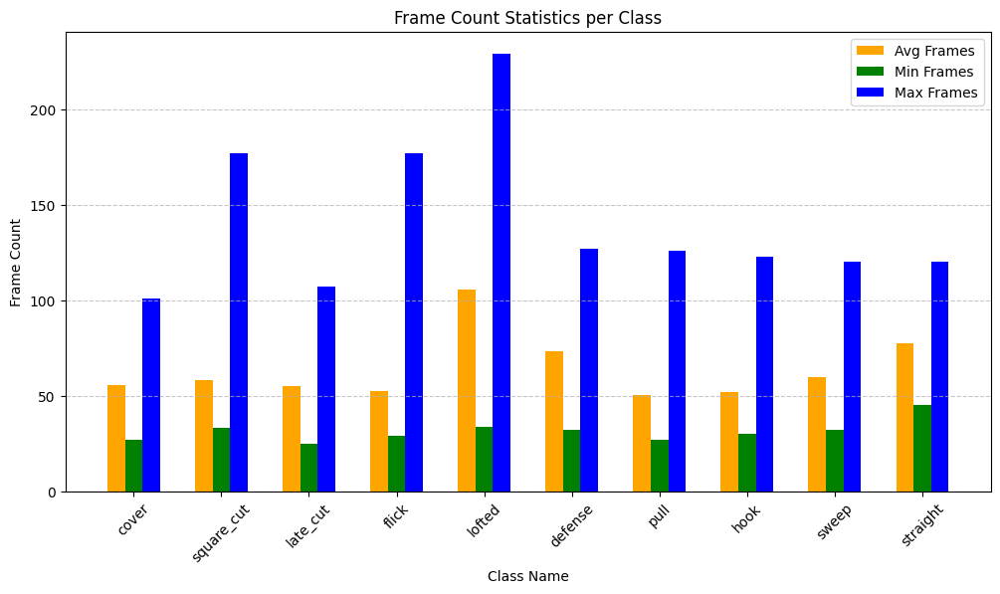

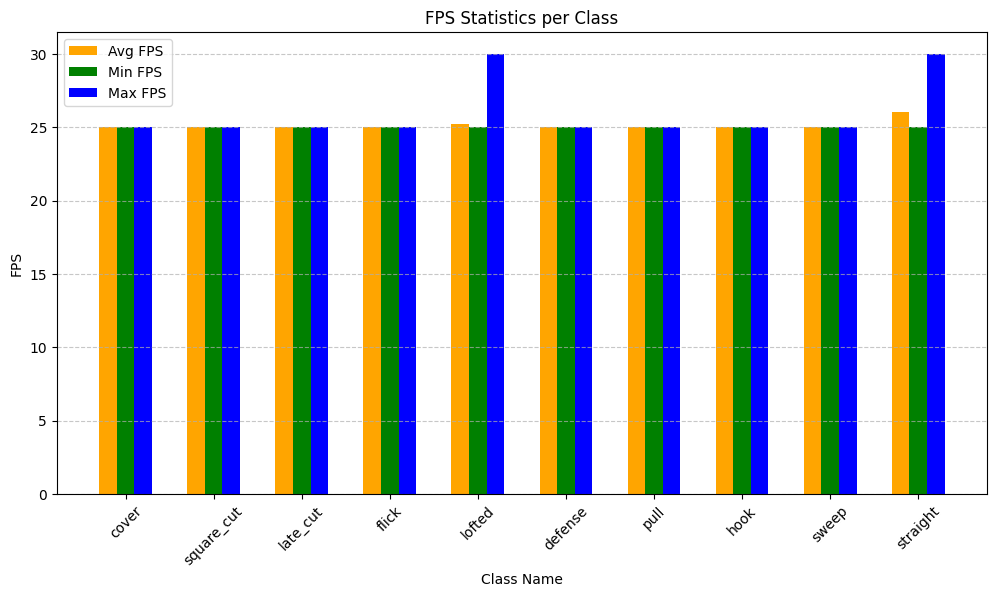

({'cover': {'avg': np.float64(55.61702127659574),
   'min': np.int64(27),
   'max': np.int64(101)},
  'square_cut': {'avg': np.float64(58.425),
   'min': np.int64(33),
   'max': np.int64(177)},
  'late_cut': {'avg': np.float64(54.97802197802198),
   'min': np.int64(25),
   'max': np.int64(107)},
  'flick': {'avg': np.float64(52.348066298342545),
   'min': np.int64(29),
   'max': np.int64(177)},
  'lofted': {'avg': np.float64(105.57575757575758),
   'min': np.int64(34),
   'max': np.int64(229)},
  'defense': {'avg': np.float64(73.28125),
   'min': np.int64(32),
   'max': np.int64(127)},
  'pull': {'avg': np.float64(50.33519553072626),
   'min': np.int64(27),
   'max': np.int64(126)},
  'hook': {'avg': np.float64(52.248618784530386),
   'min': np.int64(30),
   'max': np.int64(123)},
  'sweep': {'avg': np.float64(59.77835051546392),
   'min': np.int64(32),
   'max': np.int64(120)},
  'straight': {'avg': np.float64(77.41968911917098),
   'min': np.int64(45),
   'max': np.int64(120)}},
 {'c

In [20]:
analyze_frame_counts_and_fps(dataset_path, categories[0])

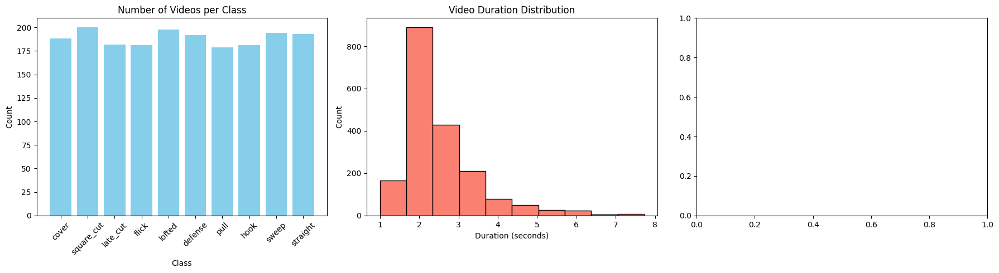

In [21]:
import os
import cv2
import random
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

def get_dataset_statistics(dataset_path):
    """
    Analyzes the dataset to compute statistics:
    - Number of videos per class
    - Video duration distribution
    - Frame rate analysis
    """
    class_counts = {}
    video_durations = []
    frame_rates = []

    for class_name in os.listdir(dataset_path):
        class_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_path):
            video_files = [f for f in os.listdir(class_path) if f.endswith(('.mp4', '.avi', '.mov'))]
            class_counts[class_name] = len(video_files)

            for video_file in video_files:
                video_path = os.path.join(class_path, video_file)
                cap = cv2.VideoCapture(video_path)
                if cap.isOpened():
                    fps = cap.get(cv2.CAP_PROP_FPS)
                    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
                    duration = total_frames / fps if fps > 0 else 0

                    frame_rates.append(fps)
                    video_durations.append(duration)
                cap.release()

    return class_counts, video_durations, frame_rates

def plot_dataset_statistics(class_counts, video_durations, frame_rates):
    """
    Plots various dataset statistics using Matplotlib.
    """
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))

    # Plot video count per class
    axs[0].bar(class_counts.keys(), class_counts.values(), color='skyblue')
    axs[0].set_title('Number of Videos per Class')
    axs[0].set_xlabel('Class')
    axs[0].set_ylabel('Count')
    axs[0].tick_params(axis='x', rotation=45)

    # Plot video duration distribution
    axs[1].hist(video_durations, bins=10, color='salmon', edgecolor='black')
    axs[1].set_title('Video Duration Distribution')
    axs[1].set_xlabel('Duration (seconds)')
    axs[1].set_ylabel('Count')


    plt.tight_layout()
    plt.savefig("/content/drive/MyDrive/figures/allthree.png", bbox_inches='tight')
    plt.show()

# Example usage
dataset_path = "/content/drive/MyDrive/CricShot10 dataset"
class_counts, video_durations, frame_rates = get_dataset_statistics(dataset_path)
plot_dataset_statistics(class_counts, video_durations, frame_rates)

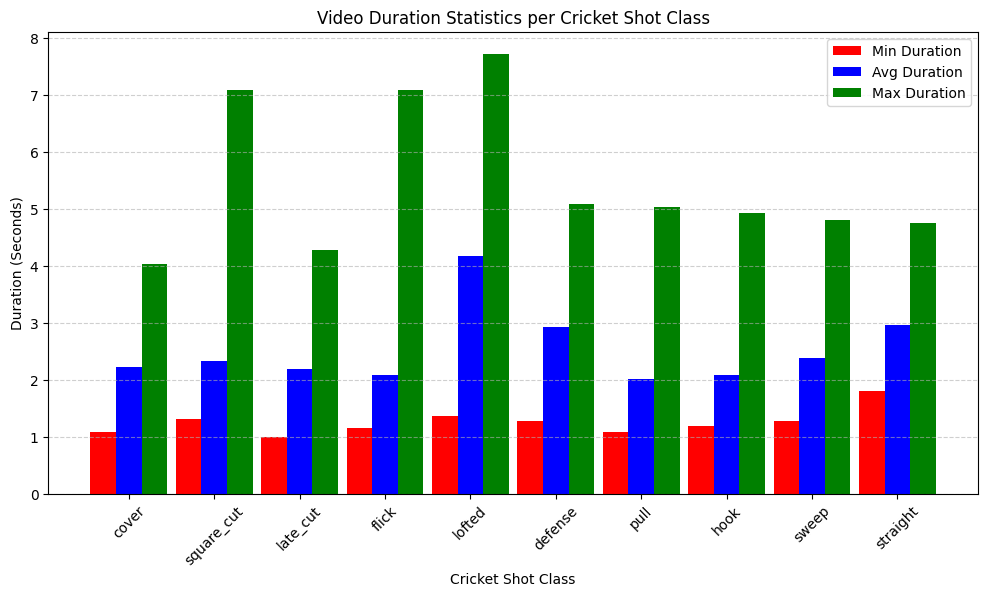

cover:
  Average Length: 2.22 seconds
  Minimum Duration: 1.08 seconds
  Maximum Duration: 4.04 seconds

square_cut:
  Average Length: 2.34 seconds
  Minimum Duration: 1.32 seconds
  Maximum Duration: 7.08 seconds

late_cut:
  Average Length: 2.20 seconds
  Minimum Duration: 1.00 seconds
  Maximum Duration: 4.28 seconds

flick:
  Average Length: 2.09 seconds
  Minimum Duration: 1.16 seconds
  Maximum Duration: 7.08 seconds

lofted:
  Average Length: 4.18 seconds
  Minimum Duration: 1.36 seconds
  Maximum Duration: 7.72 seconds

defense:
  Average Length: 2.93 seconds
  Minimum Duration: 1.28 seconds
  Maximum Duration: 5.08 seconds

pull:
  Average Length: 2.01 seconds
  Minimum Duration: 1.08 seconds
  Maximum Duration: 5.04 seconds

hook:
  Average Length: 2.09 seconds
  Minimum Duration: 1.20 seconds
  Maximum Duration: 4.92 seconds

sweep:
  Average Length: 2.39 seconds
  Minimum Duration: 1.28 seconds
  Maximum Duration: 4.80 seconds

straight:
  Average Length: 2.96 seconds
  Min

In [22]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Path to dataset
DATASET_DIR = "/content/drive/MyDrive/CricShot10 dataset"

# List of cricket shot classes
CLASSES_LIST = categories[0]

# Dictionary to store video statistics per class
video_stats = {}

for class_name in CLASSES_LIST:
    class_dir = os.path.join(DATASET_DIR, class_name)
    video_files = [f for f in os.listdir(class_dir) if f.endswith(('.mp4', '.avi', '.mov'))]  # Filter video files

    durations = []

    for video_file in video_files:
        video_path = os.path.join(class_dir, video_file)
        cap = cv2.VideoCapture(video_path)

        if cap.isOpened():
            fps = cap.get(cv2.CAP_PROP_FPS)  # Frames per second
            total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # Total frames
            duration = total_frames / fps if fps > 0 else 0  # Video duration in seconds

            durations.append(duration)

        cap.release()

    # Compute statistics for the class
    if durations:
        avg_length = np.mean(durations)
        min_duration = np.min(durations)
        max_duration = np.max(durations)
    else:
        avg_length = min_duration = max_duration = 0

    video_stats[class_name] = {
        "avg_length": avg_length,
        "min_duration": min_duration,
        "max_duration": max_duration
    }

# Extract values for plotting
classes = list(video_stats.keys())
avg_durations = [video_stats[c]["avg_length"] for c in classes]
min_durations = [video_stats[c]["min_duration"] for c in classes]
max_durations = [video_stats[c]["max_duration"] for c in classes]

# Plot bar chart for avg, min, max duration
plt.figure(figsize=(12, 6))
bar_width = 0.3
x = np.arange(len(classes))

plt.bar(x - bar_width, min_durations, bar_width, label="Min Duration", color="red")
plt.bar(x, avg_durations, bar_width, label="Avg Duration", color="blue")
plt.bar(x + bar_width, max_durations, bar_width, label="Max Duration", color="green")

plt.xlabel("Cricket Shot Class")
plt.ylabel("Duration (Seconds)")
plt.title("Video Duration Statistics per Cricket Shot Class")
plt.xticks(x, classes, rotation=45)
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.6)
plt.savefig("/content/drive/MyDrive/figures/duration.png", bbox_inches='tight')

plt.show()

# Print results
for class_name, stats in video_stats.items():
    print(f"{class_name}:")
    print(f"  Average Length: {stats['avg_length']:.2f} seconds")
    print(f"  Minimum Duration: {stats['min_duration']:.2f} seconds")
    print(f"  Maximum Duration: {stats['max_duration']:.2f} seconds")
    print()

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Path to dataset
DATASET_DIR = "/content/drive/MyDrive/CricShot10 dataset"

# List of cricket shot classes
CLASSES_LIST = ["cover", "defense", "flick", "hook", "late_cut", "lofted", "pull", "square_cut", "straight", "sweep"]

# Dictionary to store video statistics per class
video_stats = {}

for class_name in CLASSES_LIST:
    class_dir = os.path.join(DATASET_DIR, class_name)
    video_files = [f for f in os.listdir(class_dir) if f.endswith(('.mp4', '.avi', '.mov'))]  # Filter video files

    durations = []

    for video_file in video_files:
        video_path = os.path.join(class_dir, video_file)
        cap = cv2.VideoCapture(video_path)

        if cap.isOpened():
            fps = cap.get(cv2.CAP_PROP_FPS)  # Frames per second
            total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))  # Total frames
            duration = total_frames / fps if fps > 0 else 0  # Video duration in seconds

            durations.append(duration)

        cap.release()

    # Compute statistics for the class
    if durations:
        avg_length = np.mean(durations)
        std_dev = np.std(durations)
        min_duration = np.min(durations)
        max_duration = np.max(durations)
    else:
        avg_length = std_dev = min_duration = max_duration = 0

    video_stats[class_name] = {
        "avg_length": avg_length,
        "std_dev": std_dev,
        "min_duration": min_duration,
        "max_duration": max_duration
    }

# Sort classes based on avg video length
sorted_classes = sorted(video_stats.items(), key=lambda x: x[1]["avg_length"], reverse=True)

# Plot bar chart
plt.figure(figsize=(10, 5))
plt.barh([x[0] for x in sorted_classes], [x[1]["avg_length"] for x in sorted_classes], color='skyblue')
plt.xlabel("Average Length (seconds)")
plt.ylabel("Cricket Shot Class")
plt.title("Average Video Length per Cricket Shot Class")
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()

# Print results
for class_name, stats in sorted_classes:
    print(f"{class_name}:")
    # print(f"  Average Length: {stats['avg_length']:.2f} seconds")
    print(f"  Standard Deviation: {stats['std_dev']:.2f} seconds")
    # print(f"  Minimum Duration: {stats['min_duration']:.2f} seconds")
    # print(f"  Maximum Duration: {stats['max_duration']:.2f} seconds")
    print()


Class: cover, Videos: 188
Class: square_cut, Videos: 200
Class: late_cut, Videos: 182
Class: flick, Videos: 181
Class: lofted, Videos: 198
Class: defense, Videos: 192
Class: pull, Videos: 179
Class: hook, Videos: 181
Class: sweep, Videos: 194
Class: straight, Videos: 193


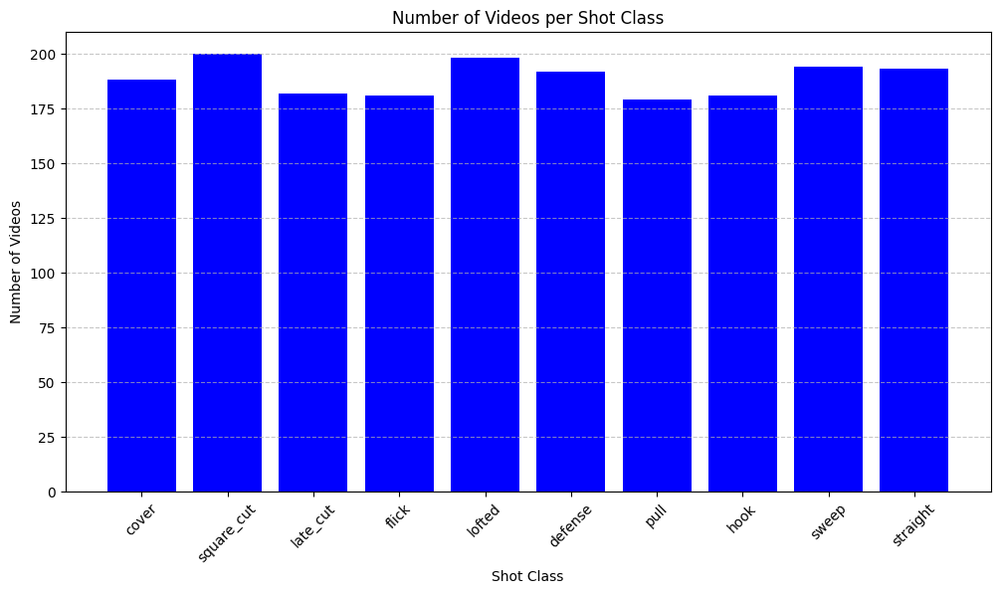

In [25]:
def count_videos_per_class(dataset_dir, classes_list):
    video_counts = {}

    for class_name in classes_list:
        class_dir = os.path.join(dataset_dir, class_name)
        if os.path.exists(class_dir):  # Ensure the directory exists
            video_counts[class_name] = len([f for f in os.listdir(class_dir) if f.endswith(('.mp4', '.avi', '.mov'))])
        else:
            video_counts[class_name] = 0  # Handle missing class folders

    # Print video counts
    for class_name, count in video_counts.items():
        print(f"Class: {class_name}, Videos: {count}")

    # Bar Chart Visualization
    plt.figure(figsize=(12, 6))
    plt.bar(video_counts.keys(), video_counts.values(), color="blue")
    plt.xlabel("Shot Class")
    plt.ylabel("Number of Videos")
    plt.title("Number of Videos per Shot Class")
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle="--", alpha=0.7)
    plt.savefig("/content/drive/MyDrive/figures/noofvideos_perclass_bar.png", bbox_inches='tight')
    plt.show()
    return video_counts
dataset_path="/content/drive/MyDrive/CricShot10 dataset"
video_counts = count_videos_per_class(dataset_path, categories[0])

In [19]:
print(video_counts)
print(sum(video_counts.values()))

{'cover': 188, 'square_cut': 200, 'late_cut': 182, 'flick': 181, 'lofted': 198, 'defense': 192, 'pull': 179, 'hook': 181, 'sweep': 194, 'straight': 193}
1888


In [23]:
import os
import plotly.graph_objects as go
import pandas as pd

def count_videos_pie_chart_plotly(dataset_dir, classes_list):
    video_counts = {}
    # Count videos per class
    if isinstance(classes_list, str):
        classes_list = [classes_list]  # Convert single string to list

    # Count videos per class
    for class_name in classes_list:
        class_dir = os.path.join(dataset_dir, class_name)
        if os.path.exists(class_dir):
            video_counts[class_name] = len([f for f in os.listdir(class_dir) if f.endswith(('.mp4', '.avi', '.mov'))])
        else:
            video_counts[class_name] = 0

    # Convert to DataFrame
    df = pd.DataFrame(list(video_counts.items()), columns=["Shot Class", "Video Count"])

    # Calculate percentages
    total = df["Video Count"].sum()
    df["Percentage"] = (df["Video Count"] / total * 100).round(1)

    # Create custom text labels showing both count and percentage
    df["Label"] = df["Percentage"].astype(str) + "%"

    # Custom color palette
    custom_colors = [
        '#6E78FF', '#FF6459', '#2ED9A3', '#B467DC', '#FFAE5C',
        '#5CCEFF', '#FF7A9B', '#BCEB6A', '#FF9CE3', '#D0B0FF'
    ]

    # Create pie chart using graph_objects
    fig = go.Figure(data=[go.Pie(
        labels=df["Shot Class"],
        values=df["Video Count"],
        # Display both count and percentage
        text=[f"{count}<br>{pct}%" for count, pct in zip(df["Video Count"], df["Percentage"])],
        textinfo="text",
        textposition="inside",
        hole=0.4,
        marker=dict(colors=custom_colors[:len(df)]),
        pull=[0] * len(df)
    )])

    # Add center text
    fig.add_annotation(
        text="Cricket Shot Dataset",
        x=0.5, y=0.5,
        font=dict(size=12),
        showarrow=False
    )

    # Update layout with legend closer to the right
    fig.update_layout(
        title={
            'text': "Data Distribution of Cricket Shot Video Dataset",
            'y':0.95,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top',
            'font': dict(size=18)
        },
        # Place legend vertically to the right with minimal spacing
        legend=dict(
            orientation="v",
            yanchor="middle",
            y=0.5,
            xanchor="left",
            x=1.02,  # Reduced spacing between chart and legend
            bordercolor="Black",
            borderwidth=1
        ),
        margin=dict(l=20, r=80, t=80, b=20),  # Adjusted right margin
        width=800,  # Set width to control overall size
        height=600  # Set height to control overall size
    )

    plt.savefig("/content/drive/MyDrive/figures/videocount_pie.png", bbox_inches='tight')
    # Show the plot
    fig.show()

    return video_counts

# # Example Usage
# dataset_path = "your_dataset_path"  # Replace with your dataset path
# categories = ["cover", "defense", "flick", "hook", "late_cut", "lofted", "pull", "square_cut", "straight", "sweep"]
video_counts = count_videos_pie_chart_plotly(dataset_path, categories[0])

<Figure size 640x480 with 0 Axes>

In [ ]:
def extract_keyframes(video_path):
    """
    Extracts keyframes (start, middle, and end) from a video file.
    """
    cap = cv2.VideoCapture(video_path)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    if total_frames > 10:
        key_frames_indices = [0, total_frames // 2, total_frames - 1]
    else:
        key_frames_indices = [0]

    frames = []
    for frame_idx in key_frames_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
        ret, frame = cap.read()
        if ret:
            frames.append(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    cap.release()
    return frames

# Display keyframes from a random video
random_class = random.choice(os.listdir(dataset_path))
random_video = random.choice(os.listdir(os.path.join(dataset_path, random_class)))
video_path = os.path.join(dataset_path, random_class, random_video)

keyframes = extract_keyframes(video_path)

plt.figure(figsize=(10, 4))
for i, frame in enumerate(keyframes):
    plt.subplot(1, len(keyframes), i+1)
    plt.imshow(frame)
    plt.axis("off")
plt.show()

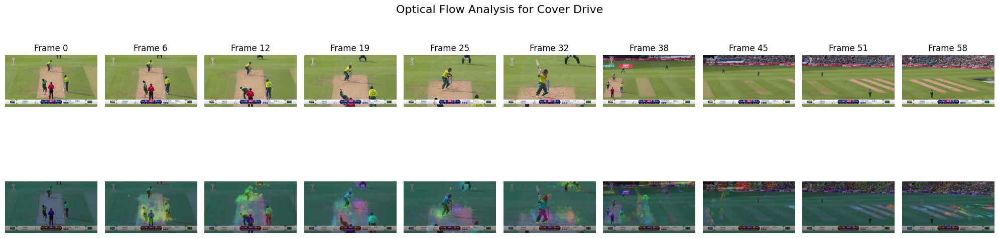

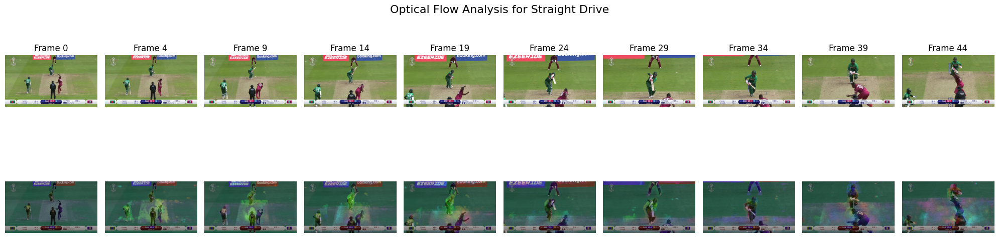

In [27]:



import cv2
import numpy as np
import matplotlib.pyplot as plt

def compute_optical_flow_per_shot(video_path, class_label, num_frames=10):
    cap = cv2.VideoCapture(video_path)
    ret, prev_frame = cap.read()

    if not ret:
        print(f"Error: Unable to read video {class_label}")
        return

    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)  # Select 10 evenly spaced frames

    fig, axes = plt.subplots(2, num_frames, figsize=(20, 8))  # Two rows (Original & Optical Flow)

    # Add space between the title and the plots
    fig.suptitle(f"Optical Flow Analysis for {class_label}", fontsize=16, y=0.8)

    for i, frame_idx in enumerate(frame_indices):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)  # Jump to frame
        ret, next_frame = cap.read()
        if not ret:
            continue

        next_gray = cv2.cvtColor(next_frame, cv2.COLOR_BGR2GRAY)

        # Compute optical flow
        flow = cv2.calcOpticalFlowFarneback(prev_gray, next_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # Convert flow to HSV
        hsv = np.zeros_like(prev_frame)
        hsv[..., 1] = 255
        mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        hsv[..., 0] = ang * 180 / np.pi / 2  # Direction
        hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)  # Magnitude

        # Convert HSV to RGB
        rgb_flow = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

        # Overlay Optical Flow on Original Frame
        blended = cv2.addWeighted(next_frame, 0.6, rgb_flow, 0.4, 0)

        # Top Row: Original Frames
        axes[0, i].imshow(cv2.cvtColor(next_frame, cv2.COLOR_BGR2RGB))
        axes[0, i].axis("off")
        axes[0, i].set_title(f"Frame {frame_idx}")

        # Bottom Row: Optical Flow Overlays
        axes[1, i].imshow(blended)
        axes[1, i].axis("off")

        prev_gray = next_gray  # Update previous frame

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to avoid overlap
    plt.savefig("/content/drive/MyDrive/figures/opticalflow.png", bbox_inches='tight')
    plt.show()
    cap.release()

# Example usage for different cricket shots
video_paths = {
    "Cover Drive": "/content/drive/MyDrive/CricShot10 dataset/cover/cover_0023.avi",
    # "Pull Shot": "/content/drive/MyDrive/cricshots/pull/pull_0001.avi",
    # "Cut Shot": "/content/drive/MyDrive/cricshots/square_cut/square_cut_0002.avi",
    "Straight Drive": "/content/drive/MyDrive/CricShot10 dataset/straight/straight_0002.avi",
    # "Sweep Shot": "/content/drive/MyDrive/cricshots/sweep/sweep_0007.avi",
}

for shot_type, video_path in video_paths.items():
    compute_optical_flow_per_shot(video_path, shot_type)

<ipython-input-28-a7f4dc87395f>:66: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



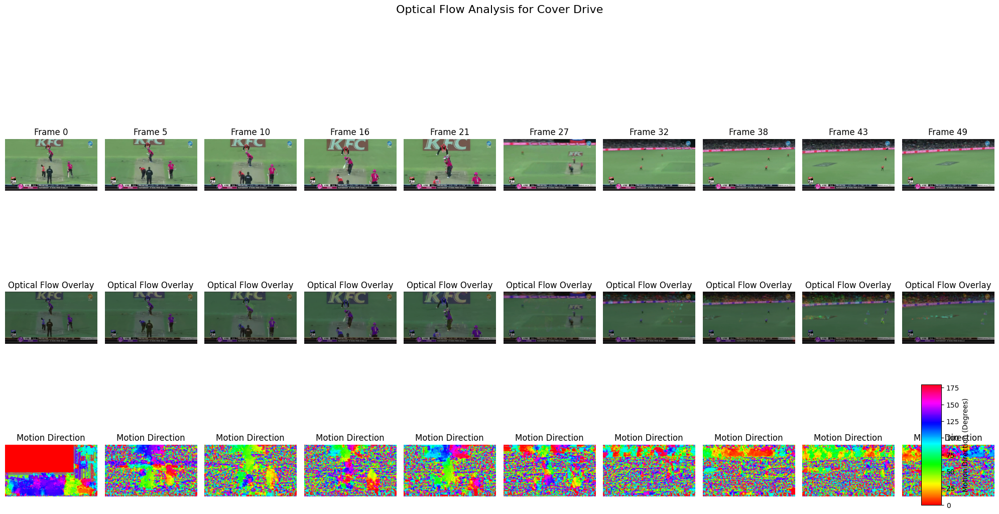

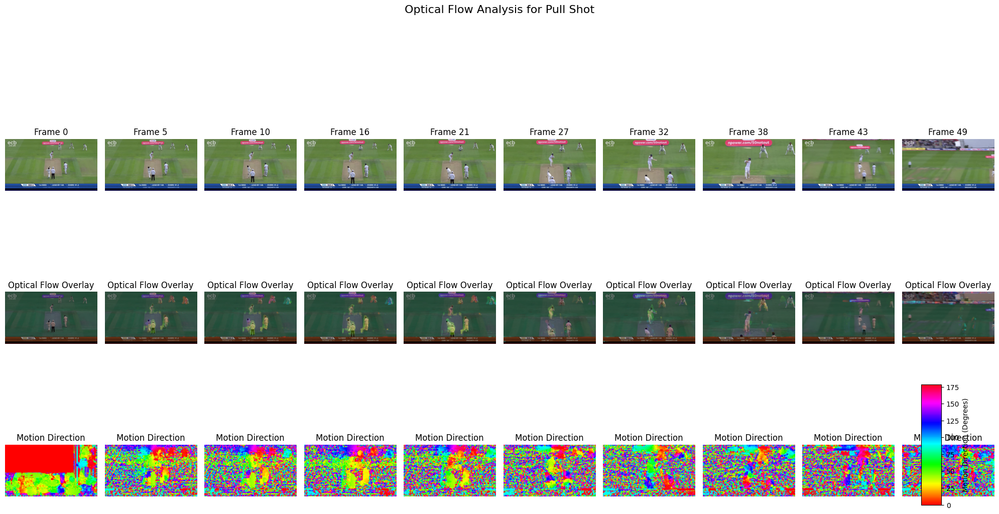

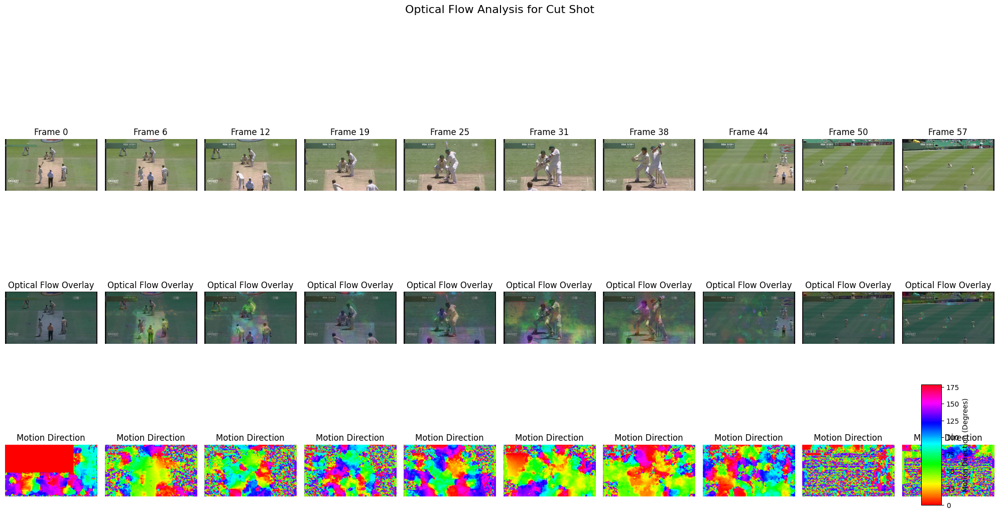

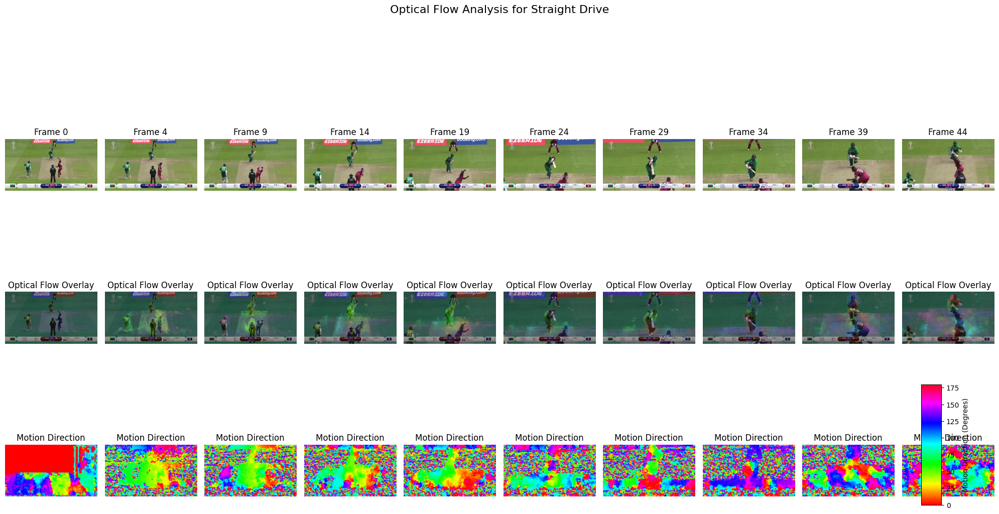

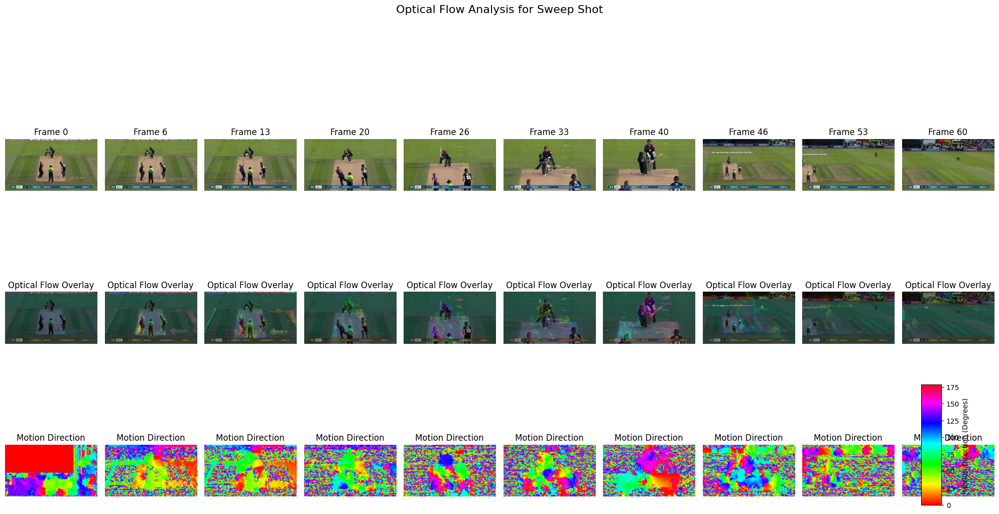

In [28]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def compute_optical_flow_per_shot(video_path, class_label, num_frames=10):
    cap = cv2.VideoCapture(video_path)
    ret, prev_frame = cap.read()

    if not ret:
        print(f"Error: Unable to read video {class_label}")
        return

    prev_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)  # Select 10 evenly spaced frames

    fig, axes = plt.subplots(3, num_frames, figsize=(20, 12))  # Three rows (Original, Optical Flow, Magnitude/Direction)
    fig.suptitle(f"Optical Flow Analysis for {class_label}", fontsize=16)

    for i, frame_idx in enumerate(frame_indices):
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)  # Jump to frame
        ret, next_frame = cap.read()
        if not ret:
            continue

        next_gray = cv2.cvtColor(next_frame, cv2.COLOR_BGR2GRAY)

        # Compute optical flow
        flow = cv2.calcOpticalFlowFarneback(prev_gray, next_gray, None, 0.5, 3, 15, 3, 5, 1.2, 0)

        # Convert flow to HSV
        hsv = np.zeros_like(prev_frame)
        hsv[..., 1] = 255
        mag, ang = cv2.cartToPolar(flow[..., 0], flow[..., 1])
        hsv[..., 0] = ang * 180 / np.pi / 2  # Direction
        hsv[..., 2] = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)  # Magnitude

        # Convert HSV to RGB
        rgb_flow = cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)

        # Overlay Optical Flow on Original Frame
        blended = cv2.addWeighted(next_frame, 0.6, rgb_flow, 0.4, 0)

        # Top Row: Original Frames
        axes[0, i].imshow(cv2.cvtColor(next_frame, cv2.COLOR_BGR2RGB))
        axes[0, i].axis("off")
        axes[0, i].set_title(f"Frame {frame_idx}")

        # Middle Row: Optical Flow Overlays
        axes[1, i].imshow(blended)
        axes[1, i].axis("off")
        axes[1, i].set_title("Optical Flow Overlay")

        # Bottom Row: Motion Magnitude and Direction
        axes[2, i].imshow(hsv[..., 0], cmap='hsv')  # Direction (Hue)
        axes[2, i].axis("off")
        axes[2, i].set_title("Motion Direction")

        # Add colorbar for motion direction
        if i == num_frames - 1:
            cax = fig.add_axes([0.92, 0.15, 0.02, 0.2])  # Position of colorbar
            plt.colorbar(axes[2, i].images[0], cax=cax, label="Motion Direction (Degrees)")

        prev_gray = next_gray  # Update previous frame

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to avoid overlap
    plt.savefig("/content/drive/MyDrive/figures/motiondetection.png", bbox_inches='tight')
    plt.show()
    cap.release()

# Example usage for different cricket shots
video_paths = {
    "Cover Drive": "/content/drive/MyDrive/CricShot10 dataset/cover/cover_0001.avi",
    "Pull Shot": "/content/drive/MyDrive/CricShot10 dataset/pull/pull_0001.avi",
    "Cut Shot": "/content/drive/MyDrive/CricShot10 dataset/square_cut/square_cut_0002.avi",
    "Straight Drive": "/content/drive/MyDrive/CricShot10 dataset/straight/straight_0002.avi",
    "Sweep Shot": "/content/drive/MyDrive/CricShot10 dataset/sweep/sweep_0007.avi",
}

for shot_type, video_path in video_paths.items():
    compute_optical_flow_per_shot(video_path, shot_type)

In [26]:
pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 59.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 21.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.4
    Uninstalling protobuf-5.29.4:
      Successfully uninstalled protobuf-5.29.4
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 4.25.7 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatib

In [29]:
import os
import cv2

# Path to dataset
DATASET_DIR = "/content/drive/MyDrive/CricShot10 dataset"

# List of cricket shot classes
CLASSES_LIST = ["cover", "defense", "flick", "hook", "late_cut", "lofted", "pull", "square_cut", "straight", "sweep"]

# Dictionary to store resolutions
resolutions = {}

for class_name in CLASSES_LIST:
    class_dir = os.path.join(DATASET_DIR, class_name)
    video_files = [f for f in os.listdir(class_dir) if f.endswith(('.mp4', '.avi', '.mov'))]  # Filter video files

    resolutions[class_name] = []

    for video_file in video_files:
        video_path = os.path.join(class_dir, video_file)
        cap = cv2.VideoCapture(video_path)

        if cap.isOpened():
            width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))  # Frame width
            height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))  # Frame height
            resolutions[class_name].append((width, height))

        cap.release()

# Print resolution statistics
for class_name, res_list in resolutions.items():
    if res_list:
        avg_width = np.mean([res[0] for res in res_list])
        avg_height = np.mean([res[1] for res in res_list])
        print(f"Class: {class_name}")
        print(f"  Average Resolution: {avg_width:.0f}x{avg_height:.0f}")
        print(f"  Min Resolution: {min([res[0] for res in res_list])}x{min([res[1] for res in res_list])}")
        print(f"  Max Resolution: {max([res[0] for res in res_list])}x{max([res[1] for res in res_list])}")
        print()

Class: cover
  Average Resolution: 1266x715
  Min Resolution: 640x480
  Max Resolution: 1280x720

Class: defense
  Average Resolution: 1280x720
  Min Resolution: 1280x720
  Max Resolution: 1280x720

Class: flick
  Average Resolution: 1280x720
  Min Resolution: 1280x720
  Max Resolution: 1280x720

Class: hook
  Average Resolution: 1273x717
  Min Resolution: 640x480
  Max Resolution: 1280x720

Class: late_cut
  Average Resolution: 1273x717
  Min Resolution: 640x480
  Max Resolution: 1280x720

Class: lofted
  Average Resolution: 1280x720
  Min Resolution: 1280x720
  Max Resolution: 1280x720

Class: pull
  Average Resolution: 1280x720
  Min Resolution: 1280x720
  Max Resolution: 1280x720

Class: square_cut
  Average Resolution: 1267x715
  Min Resolution: 640x480
  Max Resolution: 1280x720

Class: straight
  Average Resolution: 1273x718
  Min Resolution: 640x480
  Max Resolution: 1280x720

Class: sweep
  Average Resolution: 1280x720
  Min Resolution: 1280x720
  Max Resolution: 1280x720



/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

<ipython-input-30-3304792f2124>:54: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



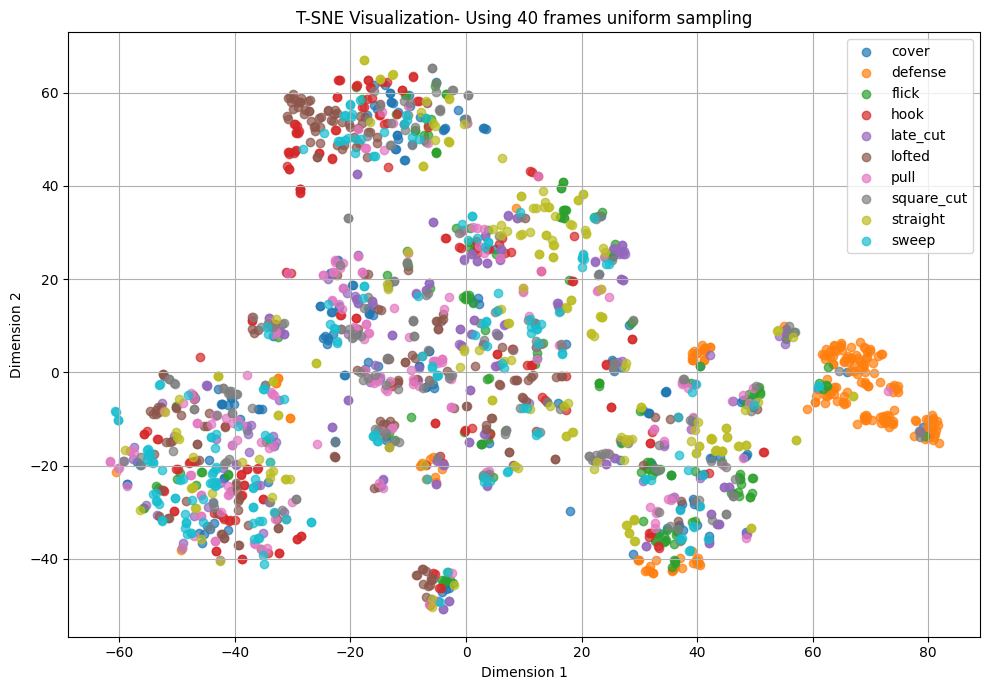

In [30]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Folder with all .pt feature files
feature_dir = '/content/drive/MyDrive/cricket_features/train'

# List of known class names (for label filtering and coloring)
class_names = ["cover", "defense", "flick", "hook", "late_cut", "lofted", "pull", "square_cut", "straight", "sweep"]

# Storage
features = []
labels = []

# Loop through each .pt file
for file in os.listdir(feature_dir):
    if file.endswith('.pt'):
        class_label = None
        for class_name in class_names:
            if file.startswith(class_name):
                class_label = class_name
                break
        if class_label is None:
            continue  # Skip files that don't match any known class

        file_path = os.path.join(feature_dir, file)
        try:
            tensor = torch.load(file_path)
            if isinstance(tensor, dict) and 'features' in tensor:
                tensor = tensor['features']
            if tensor.dim() == 2:  # [T, D]
                video_feature = tensor.mean(dim=0).numpy()
                features.append(video_feature)
                labels.append(class_label)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

# Convert to numpy
features = np.array(features)

# Normalize features
features = StandardScaler().fit_transform(features)

# Apply T-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(features)

# Plotting
plt.figure(figsize=(10, 7))
unique_labels = sorted(set(labels))
colors = plt.cm.get_cmap('tab10', len(unique_labels))

for i, label in enumerate(unique_labels):
    idxs = [j for j, l in enumerate(labels) if l == label]
    plt.scatter(tsne_results[idxs, 0], tsne_results[idxs, 1], label=label, alpha=0.7, color=colors(i))

plt.title("T-SNE Visualization- Using 40 frames uniform sampling")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/figures/tsne-40.png", bbox_inches='tight')
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

<ipython-input-31-e2ea2d9df345>:54: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



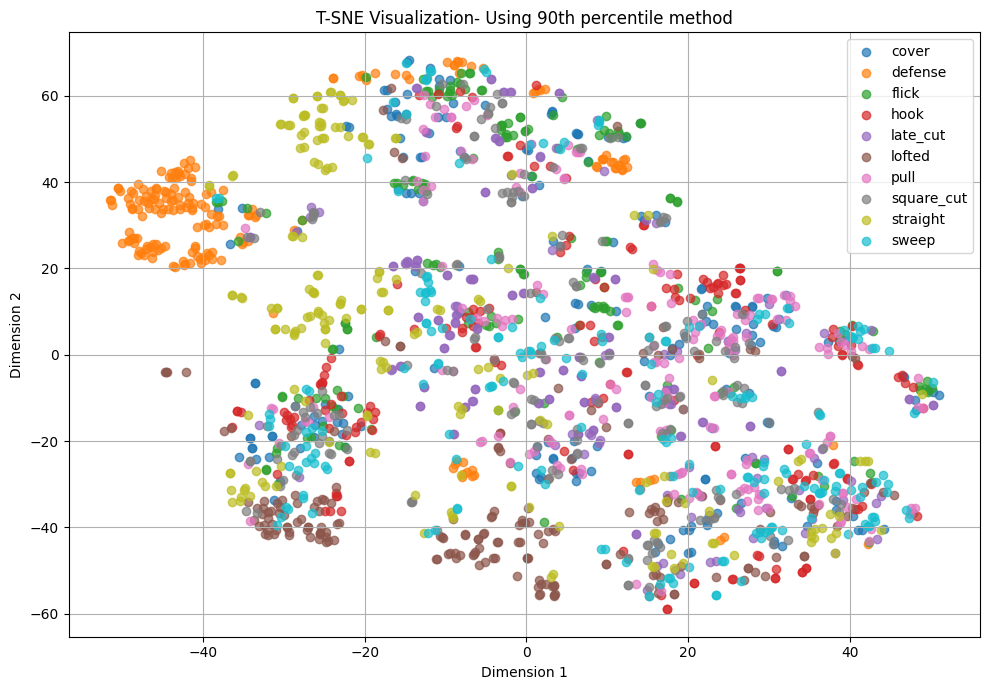

In [31]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Folder with all .pt feature files
feature_dir = '/content/drive/MyDrive/cricket_features/train-90'

# List of known class names (for label filtering and coloring)
class_names = ["cover", "defense", "flick", "hook", "late_cut", "lofted", "pull", "square_cut", "straight", "sweep"]

# Storage
features = []
labels = []

# Loop through each .pt file
for file in os.listdir(feature_dir):
    if file.endswith('.pt'):
        class_label = None
        for class_name in class_names:
            if file.startswith(class_name):
                class_label = class_name
                break
        if class_label is None:
            continue  # Skip files that don't match any known class

        file_path = os.path.join(feature_dir, file)
        try:
            tensor = torch.load(file_path)
            if isinstance(tensor, dict) and 'features' in tensor:
                tensor = tensor['features']
            if tensor.dim() == 2:  # [T, D]
                video_feature = tensor.mean(dim=0).numpy()
                features.append(video_feature)
                labels.append(class_label)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

# Convert to numpy
features = np.array(features)

# Normalize features
features = StandardScaler().fit_transform(features)

# Apply T-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(features)

# Plotting
plt.figure(figsize=(10, 7))
unique_labels = sorted(set(labels))
colors = plt.cm.get_cmap('tab10', len(unique_labels))

for i, label in enumerate(unique_labels):
    idxs = [j for j, l in enumerate(labels) if l == label]
    plt.scatter(tsne_results[idxs, 0], tsne_results[idxs, 1], label=label, alpha=0.7, color=colors(i))

plt.title("T-SNE Visualization- Using 90th percentile method")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/figures/tsne-90.png", bbox_inches='tight')
plt.show()

/usr/local/lib/python3.11/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.

<ipython-input-32-3c58e5d223ab>:54: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



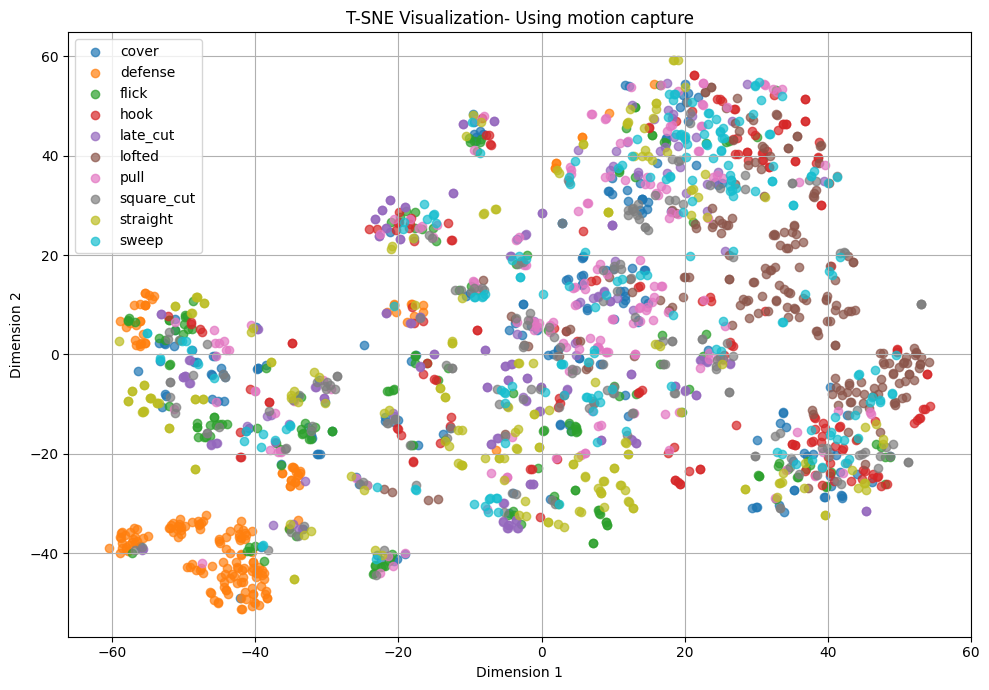

In [32]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler

# Folder with all .pt feature files
feature_dir = '/content/drive/MyDrive/cricket_features/train-new'

# List of known class names (for label filtering and coloring)
class_names = ["cover", "defense", "flick", "hook", "late_cut", "lofted", "pull", "square_cut", "straight", "sweep"]

# Storage
features = []
labels = []

# Loop through each .pt file
for file in os.listdir(feature_dir):
    if file.endswith('.pt'):
        class_label = None
        for class_name in class_names:
            if file.startswith(class_name):
                class_label = class_name
                break
        if class_label is None:
            continue  # Skip files that don't match any known class

        file_path = os.path.join(feature_dir, file)
        try:
            tensor = torch.load(file_path)
            if isinstance(tensor, dict) and 'features' in tensor:
                tensor = tensor['features']
            if tensor.dim() == 2:  # [T, D]
                video_feature = tensor.mean(dim=0).numpy()
                features.append(video_feature)
                labels.append(class_label)
        except Exception as e:
            print(f"Error loading {file_path}: {e}")

# Convert to numpy
features = np.array(features)

# Normalize features
features = StandardScaler().fit_transform(features)

# Apply T-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(features)

# Plotting
plt.figure(figsize=(10, 7))
unique_labels = sorted(set(labels))
colors = plt.cm.get_cmap('tab10', len(unique_labels))

for i, label in enumerate(unique_labels):
    idxs = [j for j, l in enumerate(labels) if l == label]
    plt.scatter(tsne_results[idxs, 0], tsne_results[idxs, 1], label=label, alpha=0.7, color=colors(i))

plt.title("T-SNE Visualization- Using motion capture")
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("/content/drive/MyDrive/figures/tsne-motion_capture.png", bbox_inches='tight')
plt.show()